[![Open holes - Construction safety](https://www.keithconstruction.ca/wp-content/uploads/2020/09/Construction-Safety-1024x536.png)](https://github.com/BitSpaceDevelopment/CV-Construction-safety-model)

# Train Facebook AI - DETR Model

---
[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/BitSpaceDevelopment/CV-Construction-safety-model)
## Use case: Open hole detection
Link to data: https://universe.roboflow.com/northeastern-4sfxe/construction-safety-open-hole-excavation-detection

 This model will be deployed to our Jetson-based edge inference systems for job sites allowing us to monitor and report on unsafe conditions surrounding excavation and earth moving. This model should run on a single-board computer; we will likely combine functionality with the PPE model to determine if somebody is wearing a harness near an unsafe excavation. 

---
## About the model:
 **DE⫶TR** (Detection Transformer) is a state-of-the-art deep learning model that combines the power of transformers with the task of end-to-end object detection, which includes complex hand-crafted object detection pipeline with a Transformer, and match Faster R-CNN with a ResNet-50, obtaining **42 AP** on COCO using half the computation power (FLOPs) and the same number of parameters. Inference in 50 lines of PyTorch.

![DETR](https://github.com/facebookresearch/detr/raw/main/.github/DETR.png)

Unlike traditional computer vision techniques, DETR approaches object detection as a direct set prediction problem. It consists of a set-based global loss, which forces unique predictions via bipartite matching, and a Transformer encoder-decoder architecture. Given a fixed small set of learned object queries, DETR reasons about the relations of the objects and the global image context to directly output the final set of predictions in parallel. Due to this parallel nature, DETR is very fast and efficient.

- Original DETR paper: https://arxiv.org/abs/2005.12872
- Original DETR repo: https://github.com/facebookresearch/detr

---

## Pro Tip: Use GPU Acceleration

If you are running this notebook in Google Colab, navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`. This will ensure your notebook uses a GPU, which will significantly speed up model training times.

---

## Steps in this training

In this notebook, we are going to cover:

- 1.Set GPU
- 2.Set up environments
- 3.Install Model Checkpoint
- 4.Preparing a custom dataset: Upload, annotate and prepared on Roboflow
- 5.Create data loaders with COCO format
- 6.Train model with PyTorch Lightning
- 7.Validation and inference with Custom Model
- 8.Download weights and save the model

---
## Visualization of interactive workflow:
![](https://2486075003-files.gitbook.io/~/files/v0/b/gitbook-x-prod.appspot.com/o/spaces%2F-M6S9nPJhEX9FYH6clfW%2Fuploads%2FfHpPTWNdCVR9qHQDeskF%2FScreen%20Shot%202022-08-24%20at%2012.35.36%20PM.png?alt=media&token=623927fe-3099-4ccd-8aaa-890bf5c0b03b)
**Let's begin!**
---
---

## 1. Set GPU

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [1]:
# Check if we have changed to GPU or not
!nvidia-smi

Mon Jun 12 14:25:09 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
# Check initial directory
import os
HOME = os.getcwd()
print(HOME)

/content


## 2. Environment setup 

In [3]:
# Install all necessary packages
!pip install -i https://test.pypi.org/simple/ supervision==0.3.0
!pip install -q transformers
!pip install -q pytorch-lightning
!pip install -q roboflow
!pip install -q timm

Looking in indexes: https://test.pypi.org/simple/, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 72.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 26.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 79.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 62.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 720.6/720.6 kB 16.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 40.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 71.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 149.6/149.6 kB 16.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━

After we installed all dependencies, we check them all again, showing their actual versions.

In [4]:
# Print all libraries
import torch
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)

# Import 
import roboflow
import supervision
import transformers
import pytorch_lightning

# Print their versions to check if they are installed properly
print(
    "roboflow:", roboflow.__version__, 
    "; supervision:", supervision.__version__, 
    "; transformers:", transformers.__version__, 
    "; pytorch_lightning:", pytorch_lightning.__version__
)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  2.0 ; cuda:  cu118
roboflow: 1.0.9 ; supervision: 0.3.0 ; transformers: 4.30.1 ; pytorch_lightning: 2.0.3


## 3. Load Model Checkpoint
In this session, we download **Facebook DETR Resnet-50** model to our working directory.

In [5]:
# Import libaries
import torch
from transformers import DetrForObjectDetection, DetrImageProcessor

# Setting 
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
# Create checkpoint constant
CHECKPOINT = 'facebook/detr-resnet-50'
# Initialize contants for detection requirements
CONFIDENCE_TRESHOLD = 0.5
IOU_TRESHOLD = 0.8

# Load actual network to the memmory
image_processor = DetrImageProcessor.from_pretrained(CHECKPOINT)
model = DetrForObjectDetection.from_pretrained(CHECKPOINT)
model.to(DEVICE)

The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      

This model has a total of 24 layers, including convolutional layers, batch normalization layers, and activation layers.

## 4. Preparing a custom dataset

We have added data, relabeled, changed annotations, and preprocessed (argumentation) all images for this step on Roboflow. The below code is to download pre-processed dataset from the site, which is in `COCO Jason` format.


In [6]:
# Create a new folder to contain the dataset
!mkdir {HOME}/datasets
%cd {HOME}/datasets

# Download dataset from Roboflow 
from roboflow import Roboflow
rf = Roboflow(api_key="bvgx6NFEHR0zZurL8c9w")
project = rf.workspace("northeastern-4sfxe").project("construction-safety-open-hole-excavation-detection")
dataset = project.version(5).download("coco")

/content/datasets
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Construction-Safety---Open-hole-/-Excavation-Detection-5 in coco:: 100%|██████████| 1850/1850 [00:01<00:00, 1590.03it/s]


**NOTE:** We can find out where our dataset was saved using the `dataset.location` property.

In [7]:
# Check dataset location path
dataset.location

'/content/datasets/Construction-Safety---Open-hole-/-Excavation-Detection-5'

## 5. Create data loaders from data in COCO Jason format
### 5.1. Extract annotation
We use CocoDetection from Pytorch to extract annotation from jason file.

In [8]:
# Import libraries
import os
import torchvision

# Set directories of annotation files for all three folders
ANNOTATION_FILE_NAME = "_annotations.coco.json"
TRAIN_DIRECTORY = os.path.join(dataset.location, "train")
VAL_DIRECTORY = os.path.join(dataset.location, "valid")
TEST_DIRECTORY = os.path.join(dataset.location, "test")

# Extend CocoDetection by adding a few changes / modifications
class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(
        self, 
        image_directory_path: str, 
        image_processor, 
        train: bool = True
    ):
        annotation_file_path = os.path.join(image_directory_path, ANNOTATION_FILE_NAME) # Update annotation path
        super(CocoDetection, self).__init__(image_directory_path, annotation_file_path) # Add them to Pytorch parent class
        self.image_processor = image_processor # Store image processor parameter

    def __getitem__(self, idx):
        images, annotations = super(CocoDetection, self).__getitem__(idx)        
        image_id = self.ids[idx]
        annotations = {'image_id': image_id, 'annotations': annotations}
        encoding = self.image_processor(images=images, annotations=annotations, return_tensors="pt") # Inject image processor in the Constructor and save
        pixel_values = encoding["pixel_values"].squeeze()
        target = encoding["labels"][0]

        return pixel_values, target

# Load 3 seperate dataset using Dataloader we just modified
TRAIN_DATASET = CocoDetection(
    image_directory_path=TRAIN_DIRECTORY, 
    image_processor=image_processor, 
    train=True)
VAL_DATASET = CocoDetection(
    image_directory_path=VAL_DIRECTORY, 
    image_processor=image_processor, 
    train=False)
TEST_DATASET = CocoDetection(
    image_directory_path=TEST_DIRECTORY, 
    image_processor=image_processor, 
    train=False)

# Print the number of examples for each dataset
print("Number of training examples:", len(TRAIN_DATASET))
print("Number of validation examples:", len(VAL_DATASET))
print("Number of test examples:", len(TEST_DATASET))

loading annotations into memory...
Done (t=0.23s)
creating index...
index created!
loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Number of training examples: 1722
Number of validation examples: 85
Number of test examples: 35


### 5.2. Visualize data entry
We try to display images to see if our data extraction in the previous step works properly.

**NOTE:** Feel free to reload this cell multiple times. Notebook should display different train set image each time.

Image #1486


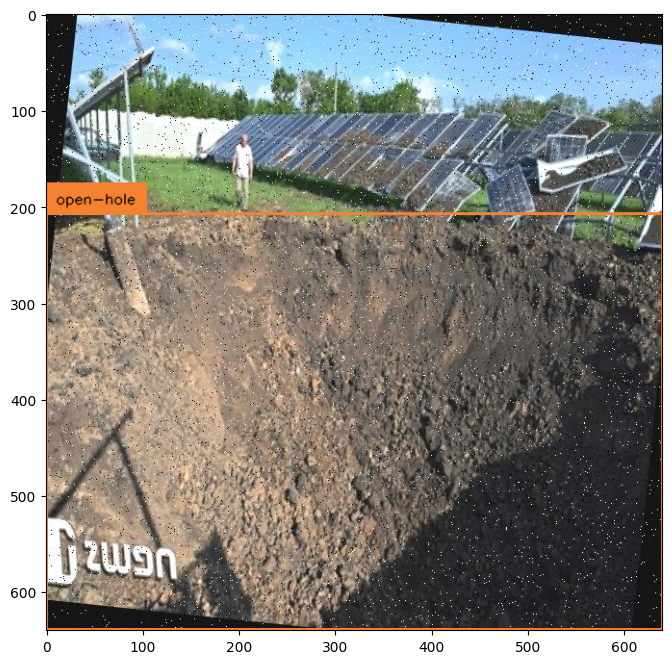

In [11]:
# Import libraries
import random
import cv2
import numpy as np
import supervision as sv


# Select random image
image_ids = TRAIN_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print('Image #{}'.format(image_id))

# Load image and annotatons 
image = TRAIN_DATASET.coco.loadImgs(image_id)[0]
annotations = TRAIN_DATASET.coco.imgToAnns[image_id]
image_path = os.path.join(TRAIN_DATASET.root, image['file_name'])
image = cv2.imread(image_path)

# Convert coco annotation into detection
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)

# Create a dictionary id2label to map class IDs to their corresponding labels 
categories = TRAIN_DATASET.coco.cats
id2label = {k: v['name'] for k,v in categories.items()}

labels = [
    f"{id2label[class_id]}" 
    for _, _, class_id, _ 
    in detections
]

# Visualize bounding boxes
box_annotator = sv.BoxAnnotator()
# Annotate the image with bounding boxes
frame = box_annotator.annotate(scene=image, detections=detections, labels=labels)

# Display the image
%matplotlib inline  
sv.show_frame_in_notebook(image, (8, 8))

### 5.3. Create Dataloaders
This code is for creating data loaders using the `DataLoader` class from the `torch.utils.data` module in PyTorch. Data loaders are used to load and preprocess data in batches during training, validation, and testing of machine learning models.

The code defines a function `collate_fn` that is used as the collate function for the data loader. The collate function is responsible for taking a list of samples and combining them into a batch. In this case, the collate function performs padding on the images in the batch to make them the same size and creates a binary pixel mask to indicate which pixels are real and which are padding.

In [12]:
from torch.utils.data import DataLoader

def collate_fn(batch):
    # DETR authors employ various image sizes during training, making it not possible 
    # to directly batch together images. Hence they pad the images to the biggest 
    # resolution in a given batch, and create a corresponding binary pixel_mask 
    # which indicates which pixels are real/which are padding
    pixel_values = [item[0] for item in batch]
    encoding = image_processor.pad(pixel_values, return_tensors="pt")
    labels = [item[1] for item in batch]
    return {
        'pixel_values': encoding['pixel_values'],
        'pixel_mask': encoding['pixel_mask'],
        'labels': labels
    }

# Create 3 data loaders accordingly
TRAIN_DATALOADER = DataLoader(dataset=TRAIN_DATASET, collate_fn=collate_fn, batch_size=8, shuffle=True) # Shuffle the data during training to get valid performance
VAL_DATALOADER = DataLoader(dataset=VAL_DATASET, collate_fn=collate_fn, batch_size=8)
TEST_DATALOADER = DataLoader(dataset=TEST_DATASET, collate_fn=collate_fn, batch_size=8)

## 6. Train model with PyTorch Lightning

### 6.1. Sets up a PyTorch Lightning module for training
This code sets up a PyTorch Lightning module for training the DETR model on object detection tasks, including the necessary forward pass, training and validation steps, and optimizer configuration. It also defines the data loaders for training and validation.

In [13]:
import pytorch_lightning as pl
from transformers import DetrForObjectDetection
import torch


class Detr(pl.LightningModule):

    def __init__(self, lr, lr_backbone, weight_decay):
        super().__init__()
        self.model = DetrForObjectDetection.from_pretrained(
            pretrained_model_name_or_path=CHECKPOINT, 
            num_labels=len(id2label),
            ignore_mismatched_sizes=True
        )
        
        self.lr = lr # Applied to whole neural networks
        self.lr_backbone = lr_backbone # Applied to only the backbone
        self.weight_decay = weight_decay # Regularization 

    def forward(self, pixel_values, pixel_mask):
        return self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    def common_step(self, batch, batch_idx):
        pixel_values = batch["pixel_values"]
        pixel_mask = batch["pixel_mask"]
        labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

        outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

        loss = outputs.loss
        loss_dict = outputs.loss_dict

        return loss, loss_dict

    def training_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)     
        # logs metrics for each training_step, and the average across the epoch
        self.log("training_loss", loss)
        for k,v in loss_dict.items():
            self.log("train_" + k, v.item())

        return loss

    def validation_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)     
        self.log("validation/loss", loss)
        for k, v in loss_dict.items():
            self.log("validation_" + k, v.item())
            
        return loss

    def configure_optimizers(self):
        # DETR authors decided to use different learning rate for backbone
        # you can learn more about it here: 
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L22-L23
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L131-L139
        param_dicts = [
            {
                "params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad]},
            {
                "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                "lr": self.lr_backbone,
            },
        ]
        return torch.optim.AdamW(param_dicts, lr=self.lr, weight_decay=self.weight_decay)

    def train_dataloader(self):
        return TRAIN_DATALOADER

    def val_dataloader(self):
        return VAL_DATALOADER

### 6.2. Some hyper-parameters that we use to tune the model

Here, we are able to pass a number of arguments:
- **lr**: The learning rate for the optimizer, which determines the step size at each iteration during training. 
- **lr_backbone**: The learning rate specific to the backbone of the model. The backbone refers to the initial layers of the model responsible for feature extraction. 
- **weight_decay**: The parameter controlling the amount of regularization applied to the model's weights during optimization. It helps prevent overfitting by penalizing large weights. 
- **devices**: The number of devices (GPUs) to train the model on.
- **accelerator**: The accelerator to use for distributed training. In this case, it is set to "gpu" for GPU training.
- **max_epochs**: The maximum number of epochs to train the model. 
- **early_stopping_callback**: whether the training should stop based on early stopping or other criteria. 
- **gradient_clip_val**: The value for gradient clipping, which prevents gradient explosion during optimization. It is set to 0.1 in this example.
- **precision**: using 32-bit floating point precision.
- **accumulate_grad_batches**: The number of batches to accumulate gradients before performing a backward pass and optimization. It is set to 8, which means gradients are accumulated over 8 batches before updating the model's parameters.
- **log_every_n_steps**: The frequency of logging training metrics, specified in the number of steps. In this case, metrics are logged every 5 steps.



In [14]:
# Train the model
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks import EarlyStopping
%cd {HOME}

# Define the EarlyStopping callback
early_stopping_callback = EarlyStopping(
    monitor='validation/loss',
    mode='min',
    patience=20.         # Update the number of epochs for early stop
)
# Set model
model = Detr(lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4)
batch = next(iter(TRAIN_DATALOADER))
outputs = model(pixel_values=batch['pixel_values'], pixel_mask=batch['pixel_mask'])

# Create the Trainer
trainer = Trainer(
    accelerator="gpu",                            # Use GPU acceleration
    max_epochs=200,                               # Train for a maximum of 200 epochs
    precision='32-true',                          # Use 32-bit floating point precision
    callbacks=[early_stopping_callback],          # Early stopping callback
    accumulate_grad_batches=16,                   # Accumulate gradients over 16 batches before optimizer step
    gradient_clip_val=0.5,                        # Clip gradients if their norm exceeds 0.5
    log_every_n_steps=5,                          # Set frequency of logging training metrics
    enable_model_summary=True                     # Enable model summary
)

# Start training
trainer.fit(model)


/content


Some weights of DetrForObjectDetection were not initialized from the model checkpoint at facebook/detr-resnet-50 and are newly initialized because the shapes did not match:
- class_labels_classifier.weight: found shape torch.Size([92, 256]) in the checkpoint and torch.Size([6, 256]) in the model instantiated
- class_labels_classifier.bias: found shape torch.Size([92]) in the checkpoint and torch.Size([6]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:

Sanity Checking: 0it [00:00, ?it/s]

Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 8. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 5. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


In [15]:
# Print all hyper-parameters we used:
for key, value in trainer.__dict__.items():
    if not key.startswith("_"):
        print(key, value)

state TrainerState(status=<TrainerStatus.FINISHED: 'finished'>, fn=<TrainerFn.FITTING: 'fit'>, stage=None)
barebones False
fit_loop <pytorch_lightning.loops.fit_loop._FitLoop object at 0x7fd6f4f83be0>
validate_loop <pytorch_lightning.loops.evaluation_loop._EvaluationLoop object at 0x7fd6f4f83d30>
test_loop <pytorch_lightning.loops.evaluation_loop._EvaluationLoop object at 0x7fd6f4f833a0>
predict_loop <pytorch_lightning.loops.prediction_loop._PredictionLoop object at 0x7fd6f4f83c70>
accumulate_grad_batches 16
callbacks [<pytorch_lightning.callbacks.early_stopping.EarlyStopping object at 0x7fd7213e0130>, <pytorch_lightning.callbacks.progress.tqdm_progress.TQDMProgressBar object at 0x7fd6f4f836d0>, <pytorch_lightning.callbacks.model_summary.ModelSummary object at 0x7fd6f4f83880>, <pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fd6f4f834c0>]
datamodule None
check_val_every_n_epoch 1
reload_dataloaders_every_n_epochs 0
gradient_clip_val 0.5
gradient_clip_algorithm

**Summary of hyper-parameters used:**

- `barebones`: Boolean indicating whether the trainer is in barebones mode, which disables automatic logging and checkpointing. (`False`)
- `accumulate_grad_batches`: Number of batches to accumulate gradients before performing backward pass and optimization. (`8`)
- `check_val_every_n_epoch`: Frequency of running validation, specified in number of epochs. (`1`)
- `reload_dataloaders_every_n_epochs`: Frequency of reloading data loaders, specified in number of epochs. (`0`)
- `gradient_clip_val`: Value for gradient clipping, preventing gradient explosion during optimization. (`0.1`)
- `gradient_clip_algorithm`: The algorithm used for gradient clipping (e.g., 'norm', 'value'). (`None`)
- `should_stop`: Boolean indicating whether the training should stop based on early stopping or other criteria. (`False`)
- `log_every_n_steps`: Frequency of logging training metrics, specified in number of steps. (`5`)
- `fast_dev_run`: Boolean indicating whether to run a fast development training loop (1 batch per train/val/test split). (`False`)
- `overfit_batches`: The fraction of training batches to use for overfitting (0.0 means no overfitting). (`0.0`)
- `limit_train_batches`: The fraction of training batches to use for training (1.0 means using the entire training set). (`1.0`)
- `limit_val_batches`: The fraction of validation batches to use for evaluation (1.0 means using the entire validation set). (`1.0`)
- `limit_test_batches`: The fraction of test batches to use for evaluation (1.0 means using the entire test set). (`1.0`)
- `limit_predict_batches`: The fraction of prediction batches to use for inference (1.0 means using the entire prediction

 set). (`1.0`)
- `num_sanity_val_steps`: Number of sanity check validation steps to run at the beginning of training. (`2`)
- `val_check_interval`: Interval for running validation, specified as a fraction of an epoch. (`1.0`)
- `val_check_batch`: Number of validation batches to use for evaluation. (`216`)



### 6.3. Training result by tensorboard
Since we save training in log file, we load it to check the training performance.

In [16]:
%cd {HOME}

%load_ext tensorboard
%tensorboard --logdir lightning_logs/

/content


<IPython.core.display.Javascript object>

## 7. Validation and inference
### 7.1. Inference on the test dataset

Let's visualize the predictions of DETR on the first image of the validation set.

In [17]:
# Load the model we just trained
model.to(DEVICE)

Detr(
  (model): DetrForObjectDetection(
    (model): DetrModel(
      (backbone): DetrConvModel(
        (conv_encoder): DetrConvEncoder(
          (model): FeatureListNet(
            (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
            (bn1): DetrFrozenBatchNorm2d()
            (act1): ReLU(inplace=True)
            (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
            (layer1): Sequential(
              (0): Bottleneck(
                (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
                (bn1): DetrFrozenBatchNorm2d()
                (act1): ReLU(inplace=True)
                (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
                (bn2): DetrFrozenBatchNorm2d()
                (drop_block): Identity()
                (act2): ReLU(inplace=True)
                (aa): Identity()
                (conv3): Conv2d(64, 256

This code is for visualizing ground truth annotations and predicted detections on a random image from the test dataset.

Image #34
ground truth image


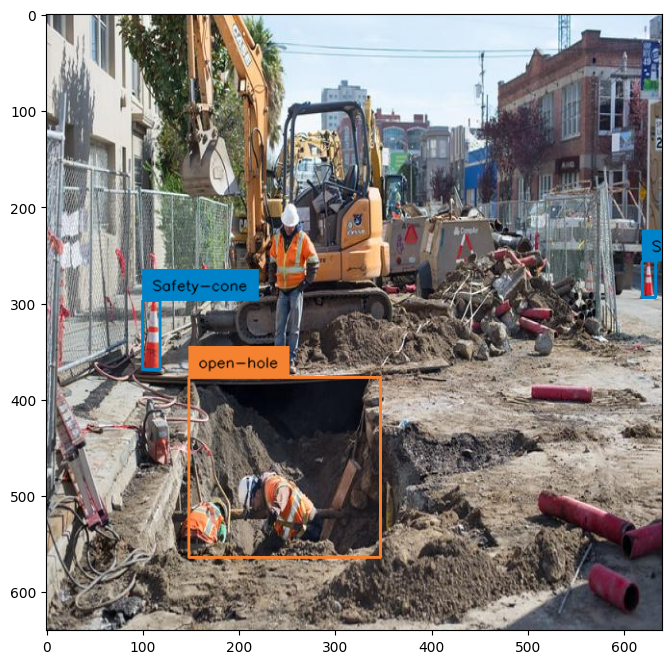

detections


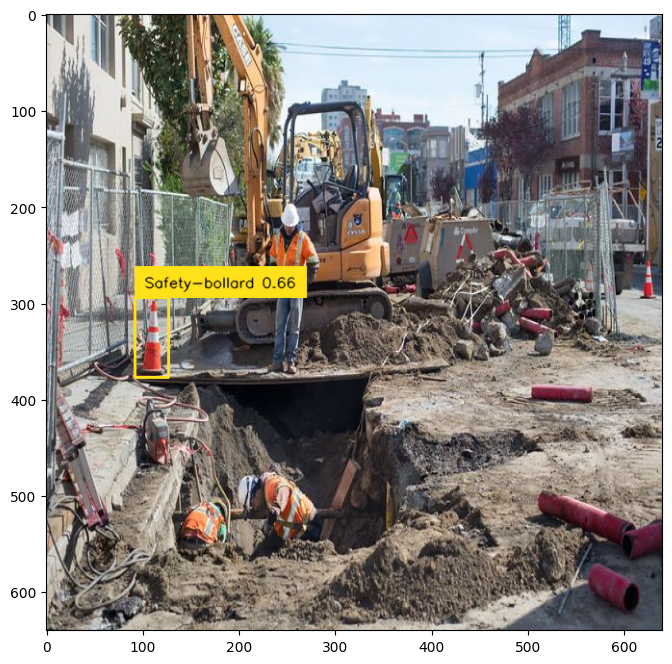

In [18]:
# Imports the necessary libraries and modules
import random
import cv2
import numpy as np
import torch
import supervision as sv


# Defines utility functions and variables for handling the COCO dataset and annotations
categories = TEST_DATASET.coco.cats
id2label = {k: v['name'] for k,v in categories.items()}
box_annotator = sv.BoxAnnotator()

# Randomly selects an image ID from the test dataset
image_ids = TEST_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print('Image #{}'.format(image_id))

# Loads the image and annotations corresponding to the selected image ID
image = TEST_DATASET.coco.loadImgs(image_id)[0]
annotations = TEST_DATASET.coco.imgToAnns[image_id]
image_path = os.path.join(TEST_DATASET.root, image['file_name'])
image = cv2.imread(image_path)

# Annotates the image with ground truth bounding boxes and labels
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)
labels = [f"{id2label[class_id]}" for _, _, class_id, _ in detections]
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

# Displays the annotated image with ground truth annotations
print('ground truth image')
%matplotlib inline  
sv.show_frame_in_notebook(frame, (8, 8))

# Performs inference on the loaded image using the trained model
with torch.no_grad():

    # Load image and predict
    inputs = image_processor(images=image, return_tensors='pt').to(DEVICE)
    outputs = model(**inputs)

    # Post-processes the model's outputs to obtain the predicted detections
    target_sizes = torch.tensor([image.shape[:2]]).to(DEVICE)
    results = image_processor.post_process_object_detection(
        outputs=outputs, 
        threshold=CONFIDENCE_TRESHOLD, 
        target_sizes=target_sizes
    )[0]

# Annotates the image with predicted bounding boxes and labels
detections = sv.Detections.from_transformers(transformers_results=results).with_nms(threshold=0.5)
labels = [f"{id2label[class_id]} {confidence:.2f}" for _, confidence, class_id, _ in detections]
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

# Displays the annotated image with predicted detections
print('detections')
%matplotlib inline  
sv.show_frame_in_notebook(frame, (8, 8))

### 7.2. Evaluation on test dataset

These code blocks below are for evaluating the performance of the object detection model on the test dataset using the COCO evaluation metrics.

In [19]:
# Installs the coco_eval package, which provides the evaluation functionality for COCO-style datasets.
!pip install -q coco_eval

  Preparing metadata (setup.py) ... done


In [20]:
# Converts bounding box coordinate to the appropriate format
def convert_to_xywh(boxes):
    xmin, ymin, xmax, ymax = boxes.unbind(1)
    return torch.stack((xmin, ymin, xmax - xmin, ymax - ymin), dim=1)

# Prepares the model's predictions in a format suitable for COCO evaluation
def prepare_for_coco_detection(predictions):
    coco_results = []
    for original_id, prediction in predictions.items():
        if len(prediction) == 0:
            continue

        boxes = prediction["boxes"]
        boxes = convert_to_xywh(boxes).tolist()
        scores = prediction["scores"].tolist()
        labels = prediction["labels"].tolist()

        coco_results.extend(
            [
                {
                    "image_id": original_id,
                    "category_id": labels[k],
                    "bbox": box,
                    "score": scores[k],
                }
                for k, box in enumerate(boxes)
            ]
        )
    return coco_results

In [21]:
# Finally, run the evaluation on test set
from coco_eval import CocoEvaluator
from tqdm.notebook import tqdm

import numpy as np

evaluator = CocoEvaluator(coco_gt=TEST_DATASET.coco, iou_types=["bbox"])

print("Running evaluation...")

# Iterates over the test dataloader to process each batch of test data
for idx, batch in enumerate(tqdm(TEST_DATALOADER)):
    pixel_values = batch["pixel_values"].to(DEVICE)
    pixel_mask = batch["pixel_mask"].to(DEVICE)
    labels = [{k: v.to(DEVICE) for k, v in t.items()} for t in batch["labels"]]

    with torch.no_grad():
      outputs = model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
    results = image_processor.post_process_object_detection(outputs, target_sizes=orig_target_sizes)

    predictions = {target['image_id'].item(): output for target, output in zip(labels, results)}
    predictions = prepare_for_coco_detection(predictions)
    evaluator.update(predictions)
    
# Synchronizes the evaluation results
evaluator.synchronize_between_processes()
evaluator.accumulate()
evaluator.summarize()

Running evaluation...


  0%|          | 0/5 [00:00<?, ?it/s]

Accumulating evaluation results...
DONE (t=0.04s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.267
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.482
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.244
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.248
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.521
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.234
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.377
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.377
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.321
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

## 8. Save and download the model
- Save the model:

In [22]:
# Check the model path
MODEL_PATH = os.path.join(HOME, 'custom-model')
print(MODEL_PATH)

/content/custom-model


In [23]:
# Save the model
model.model.save_pretrained(MODEL_PATH)

- Download the model:

In [24]:
#Export your model's weights for future use
from google.colab import files
files.download(os.path.join(MODEL_PATH, 'pytorch_model.bin'))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Thank you!
